In [726]:
import pandas as pd
import numpy as np

import ast
import nltk
from collections import defaultdict
import datetime, time
from itertools import chain

import matplotlib.pyplot as plt
import matplotlib.patches as mpatches
import seaborn as sns

from sklearn import preprocessing
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.cluster import KMeans, MiniBatchKMeans
from sklearn import cluster, metrics
from sklearn.manifold import TSNE
from sklearn import decomposition
from sklearn.decomposition import LatentDirichletAllocation
from sklearn.feature_extraction.text import CountVectorizer

from os import listdir

from matplotlib.image import imread
import cv2

from keras.preprocessing.image import load_img, img_to_array
from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16
from keras.applications.vgg16 import decode_predictions

from PIL import Image

In [4]:
data = pd.read_csv("flipkart_com-ecommerce_sample_1050.csv")

In [5]:
data.columns

Index(['uniq_id', 'crawl_timestamp', 'product_url', 'product_name',
       'product_category_tree', 'pid', 'retail_price', 'discounted_price',
       'image', 'is_FK_Advantage_product', 'description', 'product_rating',
       'overall_rating', 'brand', 'product_specifications'],
      dtype='object')

## Data Products
**uniq_id** : id unique du produit
<br/> **crawl_timestamp** : date de publication
<br/> **'product_url** : url du produit sur le site
<br/> **product_name** : nom du produit
<br/> **'product_category_tree** : arborescence des catégories du produit
<br/> **pid** : Document d'information produit (unique)
<br/> **'retail_price** : prix retail (achat)
<br/> **discounted_price** : prix de revente
<br/> **'image** : image associée
<br/> **is_FK_Advantage_product** : avantage sur ce produit
<br/> **'description** : description du produit
<br/> **product_rating** : note du produit (sur 5)
<br/> **'overall_rating** : customer statnote globale (sur 5)
<br/> **brand** : marque du produit
<br/> **'product_specifications** : specificités du produit

In [6]:
data.head(2)

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
0,55b85ea15a1536d46b7190ad6fff8ce7,2016-04-30 03:22:56 +0000,http://www.flipkart.com/elegance-polyester-mul...,Elegance Polyester Multicolor Abstract Eyelet ...,"[""Home Furnishing >> Curtains & Accessories >>...",CRNEG7BKMFFYHQ8Z,1899.0,899.0,55b85ea15a1536d46b7190ad6fff8ce7.jpg,False,Key Features of Elegance Polyester Multicolor ...,No rating available,No rating available,Elegance,"{""product_specification""=>[{""key""=>""Brand"", ""v..."
1,7b72c92c2f6c40268628ec5f14c6d590,2016-04-30 03:22:56 +0000,http://www.flipkart.com/sathiyas-cotton-bath-t...,Sathiyas Cotton Bath Towel,"[""Baby Care >> Baby Bath & Skin >> Baby Bath T...",BTWEGFZHGBXPHZUH,600.0,449.0,7b72c92c2f6c40268628ec5f14c6d590.jpg,False,Specifications of Sathiyas Cotton Bath Towel (...,No rating available,No rating available,Sathiyas,"{""product_specification""=>[{""key""=>""Machine Wa..."


In [7]:
data.describe(include="all")

,uniq_id,crawl_timestamp,product_url,product_name,product_category_tree,pid,retail_price,discounted_price,image,is_FK_Advantage_product,description,product_rating,overall_rating,brand,product_specifications
count,1050,1050,1050,1050,1050,1050,1049.000000,1049.000000,1050,1050,1050,1050,1050,712,1049
unique,1050,149,1050,1050,642,1050,NaN,NaN,1050,2,1050,27,27,490,984
top,3693c4e7f7efb47edb3d9eec067ffd93,2015-12-01 12:40:44 +0000,http://www.flipkart.com/fluid-fs201-bl01-analo...,Vincent Valentine Paris Set of Dark Fire & Dar...,"[""Home Furnishing >> Bed Linen >> Blankets, Qu...",MUGEAGGKRGWGGBTW,NaN,NaN,3b80ac036843b278083fabfd9a3c84ff.jpg,False,"Key Features of You Got Plan B Baby Boy's, Bab...",No rating available,No rating available,PRINT SHAPES,"{""product_specification""=>[{""key""=>""Type"", ""va..."
freq,1,150,1,1,56,1,NaN,NaN,1,993,1,889,889,11,22
mean,NaN,NaN,NaN,NaN,NaN,NaN,2186.197331,1584.527169,NaN,NaN,NaN,NaN,NaN,NaN,NaN
std,NaN,NaN,NaN,NaN,NaN,NaN,7639.229411,7475.099680,NaN,NaN,NaN,NaN,NaN,NaN,NaN
min,NaN,NaN,NaN,NaN,NaN,NaN,35.000000,35.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
25%,NaN,NaN,NaN,NaN,NaN,NaN,555.000000,340.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,NaN,NaN,NaN,NaN,NaN,999.000000,600.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,NaN,NaN,NaN,NaN,NaN,1999.000000,1199.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [8]:
len(data["description"].values)

1050

In [9]:
#Un exemple de description de produit
data["description"].values[0]

'Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant curtain that softly filters light in your room so that you

In [10]:
#On crée une variable qui concatène le Titre et la Description du produit
data["texte"] = data["product_name"] + " " + data["description"]

# TRAITEMENT TEXTE 

## 1- Exploration du corpus

In [11]:
tokenizer = nltk.RegexpTokenizer(r'[a-zA-Z]{4,}')
stopwords = list(nltk.corpus.stopwords.words('english'))
stemmer = nltk.stem.snowball.EnglishStemmer()

In [12]:
#On retire les stopwords, on racinise (stemming) et on compte les fréquences
words = []
words_no_stop_stemm_text = []

start = datetime.datetime.now()

for text in data["texte"]:
    words += tokenizer.tokenize(text)
    
for m in words:
    m_stem = stemmer.stem(m)
    if m_stem not in stopwords:
         words_no_stop_stemm_text.append(m_stem)
                
end = datetime.datetime.now()
time_nn = (end - start).total_seconds()
print("Durée traitement : ", time_nn)

freq = nltk.FreqDist(words_no_stop_stemm_text)
stat = len(words_no_stop_stemm_text)

Durée traitement :  1.272043


C:\Users\yacin\anaconda3\envs\tensorflow_env\lib\site-packages\ipykernel_launcher.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  # This is added back by InteractiveShellApp.init_path()


Text(0.5, 1.0, 'Top 20 des mots')

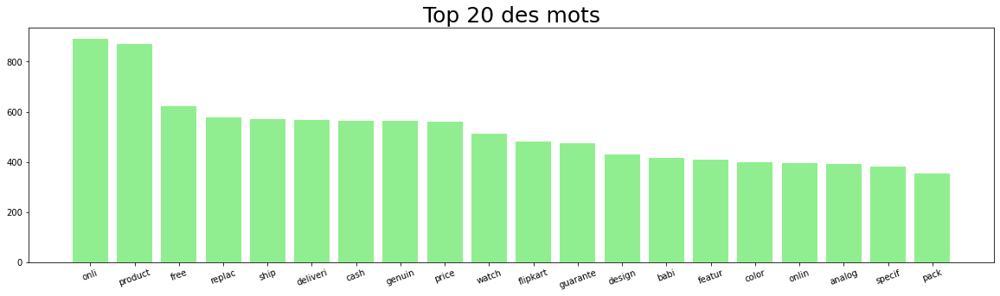

In [13]:
#On crée un dataframe contenant les fréquences par mot et on trace le graph
df = pd.DataFrame.from_dict(freq, orient='index', columns=["iteration"])
df = df.sort_values(by=["iteration"], ascending=False)

i = 0
j = 20
main_key_words = df.index[i:j]
main_key_values = df['iteration'].values[i:j]

fix, ax = plt.subplots(figsize=(20,5))
ax.set_xticklabels(main_key_words, fontsize = 10, rotation=20)
plt.bar(main_key_words,main_key_values, color="lightgreen")
title = "Top " + str(j) + " des mots"
plt.title(title, fontsize=25)

# 2- Exploration des catégories

In [14]:
#On regarde la structure de la colonne catégorie
data["product_category_tree"][0]

'["Home Furnishing >> Curtains & Accessories >> Curtains >> Elegance Polyester Multicolor Abstract Eyelet Do..."]'

In [15]:
#On recupère la catégorie principale et la secondaire
main_categories = []
second_categories = []

for category_tree in data["product_category_tree"]:
    category_tree_clean = category_tree.split('"')[1]
    main_categories.append(category_tree_clean.split(" >> ")[0])
    second_categories.append(category_tree_clean.split(" >> ")[1])

In [16]:
#On ajoute les colonnes catégories principales et catégories secondaires dans le dataframe
data["product_main_category"] = main_categories
data["product_second_category"] = second_categories

In [17]:
# On liste les catégories principales
nb_main_categories = len(np.unique(main_categories))
print("Liste des", nb_main_categories, "catégories principales:", np.unique(main_categories))

Liste des 7 catégories principales: ['Baby Care' 'Beauty and Personal Care' 'Computers'
 'Home Decor & Festive Needs' 'Home Furnishing' 'Kitchen & Dining'
 'Watches']


In [18]:
# On liste les catégories secondaires
nb_second_categories = len(np.unique(second_categories))
print("Liste des", nb_second_categories, " catégories principales:", np.unique(second_categories))

Liste des 62  catégories principales: ['Baby & Kids Gifts' 'Baby Bath & Skin' 'Baby Bedding' 'Baby Grooming'
 'Bar & Glassware' 'Bath Linen' 'Bath and Spa' 'Beauty Accessories'
 'Bed Linen' 'Body and Skin Care' 'Candles & Fragrances' 'Clocks'
 'Coffee Mugs' 'Combos and Kits' 'Computer Components'
 'Computer Peripherals' 'Consumables & Disposables' 'Containers & Bottles'
 'Cookware' 'Curtains & Accessories' 'Cushions, Pillows & Covers'
 'Decorative Lighting & Lamps' 'Diapering & Potty Training'
 'Dinnerware & Crockery' 'Eye Care' 'Feeding & Nursing' 'Floor Coverings'
 'Flowers, Plants & Vases' 'Fragrances' 'Furniture & Furnishings'
 'Garden & Leisure' 'Hair Care' 'Health Care' 'Housekeeping & Laundry'
 'Infant Wear' 'JMD Home Furnishing' 'Kitchen & Dining Linen'
 'Kitchen Tools' "Kripa's Home Furnishing" 'Laptop Accessories' 'Laptops'
 'Lighting' 'Living' 'Living Room Furnishing' 'Makeup' "Men's Grooming"
 'Network Components' 'Pressure Cookers & Pans' 'Religion & Devotion'
 'Showpiece'

In [19]:
#On regarde le nombre de mots par catégorie principale
data["product_main_category"].value_counts()

Watches                       150
Beauty and Personal Care      150
Kitchen & Dining              150
Baby Care                     150
Computers                     150
Home Decor & Festive Needs    150
Home Furnishing               150
Name: product_main_category, dtype: int64

In [109]:
#On regarde le nombre de mots par catégorie secondaire
data["product_second_category"].value_counts()

Wrist Watches                      149
Laptop Accessories                  87
Infant Wear                         84
Coffee Mugs                         74
Showpieces                          71
                                  ... 
JMD Home Furnishing                  1
Strollers & Activity Gear            1
Garden & Leisure                     1
TRUE Home Decor & Festive Needs      1
Candles & Fragrances                 1
Name: product_second_category, Length: 62, dtype: int64

In [21]:
#On crée un dictionnaire avec le nom du produit en clé et la catégorie en valeur
i = len(data)
dict_product_main_category = dict(zip(data["texte"].values[:i], data["product_main_category"].values[:i]))

words = defaultdict(list)
words_no_stop_stemm = defaultdict(list)

for text, main_category in dict_product_main_category.items():
    words[main_category] += tokenizer.tokenize(text)

for main_category, text in dict(words).items():
    liste = []
    for word in text:
        m_stem = stemmer.stem(word)
        if m_stem not in stopwords:
            liste.append(m_stem)
            
    words_no_stop_stemm[main_category] = liste

C:\Users\yacin\anaconda3\envs\tensorflow_env\lib\site-packages\ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


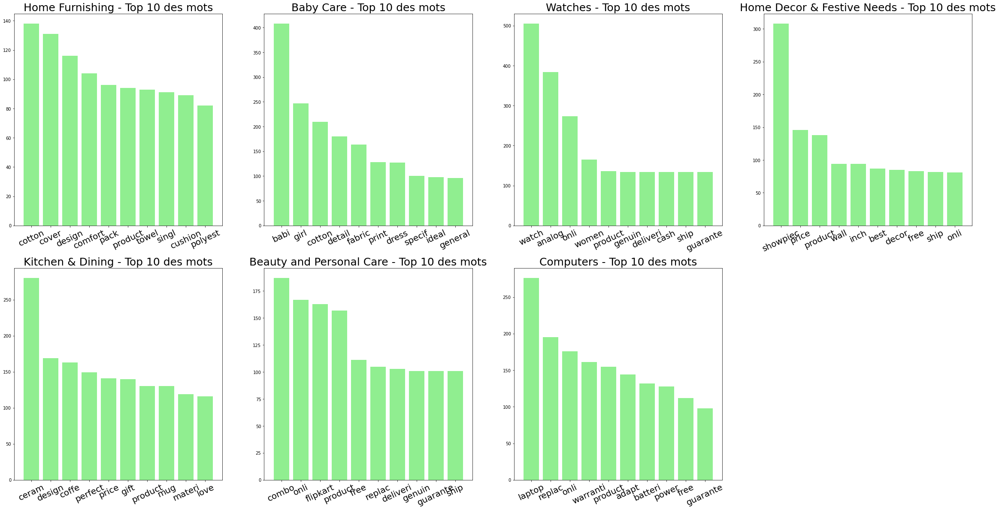

In [131]:
#On trace le graph bar par catégorie
fig = plt.figure(figsize=(40,20))
k = 1

for c in words_no_stop_stemm.keys():
    freq = nltk.FreqDist(words_no_stop_stemm[c])
    df = pd.DataFrame.from_dict(freq, orient='index', columns=["iteration"])
    df = df.sort_values(by=["iteration"], ascending=False)

    i = 0
    j = 10
    main_key_words = df.index[i:j]
    main_key_values = df['iteration'].values[i:j]

    ax = fig.add_subplot(2,4,k)
    ax.set_xticklabels(main_key_words, fontsize = 20, rotation=25)
    plt.bar(main_key_words,main_key_values, color = "lightgreen")
    title = c + " - Top "+ str(j) +" des mots"
    plt.title(title, fontsize=25)

    k += 1

## 3 - Optimisation des stopwords

In [191]:
# on rajoute les mots les plus frequents dans les stopwords
i = 9
corpus = list(chain.from_iterable(list(words_no_stop_stemm.values())))
freq = nltk.FreqDist(corpus)
df_stopwords = pd.DataFrame.from_dict(freq, orient='index', columns=["iteration"])
df_stopwords = df_stopwords.sort_values(by=["iteration"], ascending=False)

most_freq_word = list(df_stopwords.head(i).index)

In [214]:
most_freq_word

['onli',
 'product',
 'free',
 'replac',
 'ship',
 'deliveri',
 'genuin',
 'cash',
 'price']

In [215]:
stopwords_manual = ["flipkart", "man", "girl", "woman", "guarante", "warranti", "color", "featur"
                    , "specif", "pack", "onlin", "sale", "brand"]

In [216]:
stopwords = list(nltk.corpus.stopwords.words('english')) + most_freq_word + stopwords_manual

In [217]:
#On retire les stopwords, on racinise (stemming) et on compte les fréquences
words = []
words_no_stop_stemm_text = []

start = datetime.datetime.now()

for text in data["texte"]:
    words += tokenizer.tokenize(text)
    
for m in words:
    m_stem = stemmer.stem(m)
    if m_stem not in stopwords:
         words_no_stop_stemm_text.append(m_stem)
                
end = datetime.datetime.now()
time_nn = (end - start).total_seconds()
print(time_nn)

freq = nltk.FreqDist(words_no_stop_stemm_text)
stat = len(words_no_stop_stemm_text)

1.806452


In [218]:
len(words_no_stop_stemm_text)

44014

C:\Users\yacin\anaconda3\envs\tensorflow_env\lib\site-packages\ipykernel_launcher.py:11: UserWarning: FixedFormatter should only be used together with FixedLocator
  # This is added back by InteractiveShellApp.init_path()


Text(0.5, 1.0, 'Top 20 des mots')

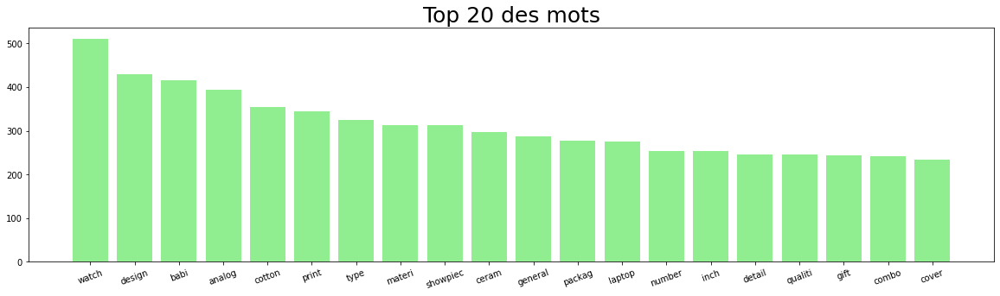

In [219]:
#On crée un dataframe contenant les fréquences par mot et on trace le graph
df = pd.DataFrame.from_dict(freq, orient='index', columns=["iteration"])
df = df.sort_values(by=["iteration"], ascending=False)

i = 0
j = 20
main_key_words = df.index[i:j]
main_key_values = df['iteration'].values[i:j]

fix, ax = plt.subplots(figsize=(20,5))
ax.set_xticklabels(main_key_words, fontsize = 10, rotation=20)
plt.bar(main_key_words,main_key_values, color="lightgreen")
title = "Top " + str(j) + " des mots"
plt.title(title, fontsize=25)

In [220]:
#On crée un dictionnaire avec le nom du produit en clé et la catégorie en valeur
i = len(data)
dict_product_main_category = dict(zip(data["texte"].values[:i], data["product_main_category"].values[:i]))

words = defaultdict(list)
words_no_stop_stemm_opt = defaultdict(list)

for text, main_category in dict_product_main_category.items():
    words[main_category] += tokenizer.tokenize(text)

for main_category, text in dict(words).items():
    liste = []
    for word in text:
        m_stem = stemmer.stem(word)
        if m_stem not in stopwords:
            liste.append(m_stem)
            
    words_no_stop_stemm_opt[main_category] = liste

C:\Users\yacin\anaconda3\envs\tensorflow_env\lib\site-packages\ipykernel_launcher.py:16: UserWarning: FixedFormatter should only be used together with FixedLocator
  app.launch_new_instance()


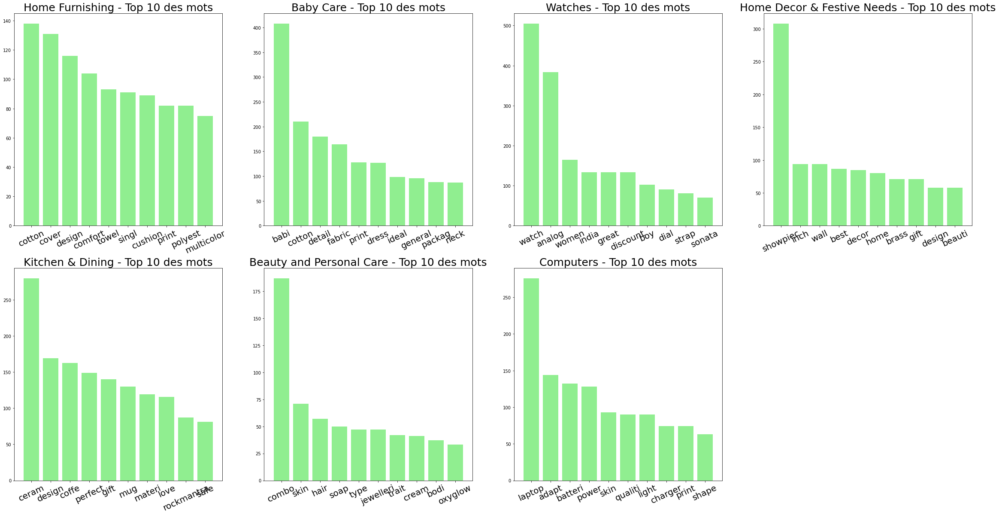

In [221]:
#On trace le graph bar par catégorie
fig = plt.figure(figsize=(40,20))
k = 1

for c in words_no_stop_stemm_opt.keys():
    freq = nltk.FreqDist(words_no_stop_stemm_opt[c])
    df = pd.DataFrame.from_dict(freq, orient='index', columns=["iteration"])
    df = df.sort_values(by=["iteration"], ascending=False)

    i = 0
    j = 10
    main_key_words = df.index[i:j]
    main_key_values = df['iteration'].values[i:j]
    
    ax = fig.add_subplot(2,4,k)
    ax.set_xticklabels(main_key_words, fontsize = 20, rotation=25)
    plt.bar(main_key_words,main_key_values, color = "lightgreen")
    title = c + " - Top "+ str(j) +" des mots"
    plt.title(title, fontsize=25)

    k += 1

In [222]:
#On crée un dictionnaire avec le nom du produit en clé et la catégorie en valeur
i = len(data)
dict_product_main_category = dict(zip(data["texte"].values[:i], data["product_name"].values[:i]))

words = defaultdict(list)
words_no_stop_stemm_final = defaultdict(list)

for text, name in dict_product_main_category.items():
    words[name] += tokenizer.tokenize(text)

for name, text in dict(words).items():
    liste = []
    for word in text:
        m_stem = stemmer.stem(word)
        if m_stem not in stopwords:
            liste.append(m_stem)
            
    words_no_stop_stemm_final[name] = liste

In [223]:
list_words = list(words_no_stop_stemm_final.values())

In [224]:
len(list_words)

1050

In [225]:
#On recréer notre corpus optimisé
corpus = []
for w in list_words:
    corpus.append(" ".join(w))

In [226]:
data.loc[1,"texte"]

'Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel'

In [227]:
corpus[1]

'sathiya cotton bath towel sathiya cotton bath towel bath towel yellow blue bath towel machin washabl materi cotton design self design general sathiya type bath towel model name sathiya cotton bath towel ideal women boy model asvtwl yellow blue size mediam dimens length inch width inch number content packag packag bath towel'

# 4 - Exploration du corpus à l'aide d'une tSNE

In [228]:
vectorizer = TfidfVectorizer(stop_words='english')
X = vectorizer.fit_transform(corpus)

In [229]:
X.shape

(1050, 3557)

In [230]:
print("Dimensions dataset avant réduction PCA : ", X.shape)
pca = decomposition.PCA(n_components= 0.99)
X_pca= pca.fit_transform(X.toarray())
print("Dimensions dataset après réduction PCA : ", X_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 3557)
Dimensions dataset après réduction PCA :  (1050, 782)


In [333]:
x_min = 0
x_max = len(corpus)
tsne = TSNE(n_components=2, perplexity=50, verbose=1, random_state=123)
X_tsne = tsne.fit_transform(X_pca[x_min:x_max])
print("Dimensions dataset après réduction tSNE : ", X_tsne.shape)

[t-SNE] Computing 151 nearest neighbors...
[t-SNE] Indexed 1050 samples in 0.002s...
ERROR! Session/line number was not unique in database. History logging moved to new session 532
[t-SNE] Computed neighbors for 1050 samples in 0.065s...
[t-SNE] Computed conditional probabilities for sample 1000 / 1050
[t-SNE] Computed conditional probabilities for sample 1050 / 1050
[t-SNE] Mean sigma: 0.407422
[t-SNE] KL divergence after 250 iterations with early exaggeration: 68.303177
[t-SNE] KL divergence after 1000 iterations: 0.898211
Dimensions dataset après réduction tSNE :  (1050, 2)


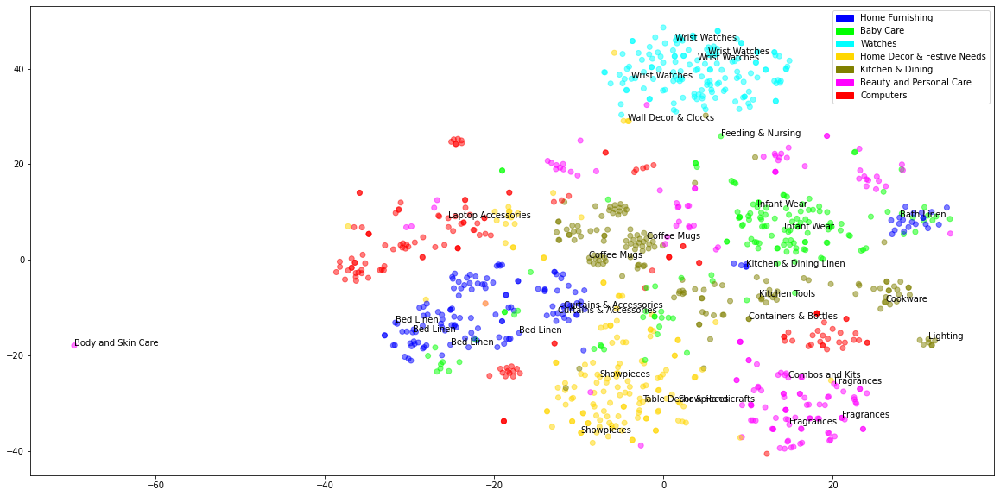

In [358]:
#On représente nos données

colors = []
legend =[]
categ = data["product_main_category"].unique()
color = ["blue","lime","cyan","gold","olive","magenta","red"]

for c in data["product_main_category"]:
    for i, ca in enumerate(categ):
        if c == ca:
            colors.append(color[i])
            
for i, ca in enumerate(categ):
    legend.append(mpatches.Patch(color=color[i], label=categ[i]))

fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(X_tsne[:,0],X_tsne[:,1], c=colors[x_min:x_max], alpha=0.5)
ax.legend(handles=legend) 

for i, txt in enumerate(data["product_second_category"][x_min:x_max]):
#     if i%201 == 0 :
    if i%34 == 0 or X_tsne[i,0] < -60:
        ax.annotate(txt, (X_tsne[i,0], X_tsne[i,1]))

## 5 - Utilisation du Kmeans pour determiner les centroids

In [479]:
k = 7
model = KMeans(n_clusters=k, init='k-means++', max_iter=100, n_init=1, random_state=2)
model.fit(X)

KMeans(max_iter=100, n_clusters=7, n_init=1, random_state=2)

In [480]:
order_centroids = model.cluster_centers_.argsort()[:, ::-1]
terms = vectorizer.get_feature_names()

In [481]:
for i in range(k):
    print("Cluster {}: {} ".format(i, [terms[ind] for ind in order_centroids[i, :5]]))
    print( "----------------------------" )

Cluster 0: ['combo', 'blanket', 'tenda', 'router', 'doubl'] 
----------------------------
Cluster 1: ['laptop', 'batteri', 'cell', 'adapt', 'pavilion'] 
----------------------------
Cluster 2: ['showpiec', 'best', 'kadhai', 'pizza', 'sticker'] 
----------------------------
Cluster 3: ['babi', 'cotton', 'towel', 'dress', 'fabric'] 
----------------------------
Cluster 4: ['ceram', 'coffe', 'rockmantra', 'prithish', 'mug'] 
----------------------------
Cluster 5: ['watch', 'analog', 'women', 'sonata', 'discount'] 
----------------------------
Cluster 6: ['cover', 'singl', 'inch', 'comfort', 'quilt'] 
----------------------------


In [507]:
le = preprocessing.LabelEncoder()
data["label"] = le.fit_transform(data["product_main_category"])
data["cluster"] = model.labels_

labels = data["label"]
print("ARI : ", round(metrics.adjusted_rand_score(labels, model.labels_), 2))

ARI :  0.39


In [478]:
# Cluster 0 = Baby Care
# Cluster 1 = Computers ?
# Cluster 2 = Beauty and Personal Care
# Cluster 3 = Watches
# Cluster 4 = Kitchen & Dining
# Cluster 5 = Home Decor & Festive Needs
# Cluster 6 = Computers ?
#  Home Furnishing ?

In [595]:
pivot_table = pd.pivot_table(data=data,index=['cluster','product_main_category'],aggfunc={"count"})
pivot_table = pivot_table["brand"]
pivot_table = pivot_table.reset_index()

pivot_table.loc[:,"pourcentage"] = 0
for i in pivot_table["cluster"].unique():
    pivot_table.loc[pivot_table["cluster"] == i,"pourcentage"] = round((pivot_table["count"]
                                                                    /sum(pivot_table[pivot_table["cluster"] == i]["count"]))*100,1)
pourcentage_table = pd.pivot_table(data=pivot_table,index=['cluster','product_main_category'])
pourcentage_table = pourcentage_table[["pourcentage"]]
pourcentage_table

pourcentage
cluster product_main_category                  
0       Baby Care                           9.9
        Beauty and Personal Care           16.8
        Computers                          44.7
        Home Decor & Festive Needs          3.1
        Home Furnishing                    18.0
        Kitchen & Dining                    7.5
        Watches                             0.0
1       Computers                         100.0
2       Baby Care                           4.9
        Beauty and Personal Care            1.8
        Computers                           8.5
        Home Decor & Festive Needs         62.2
        Kitchen & Dining                   22.6
3       Baby Care                          79.3
        Home Furnishing                    20.7
4       Baby Care                           9.1
        Kitchen & Dining                   90.9
5       Watches                           100.0
6       Baby Care                          10.2
        Beauty and Personal Care            5.3
        Computers                           6.8
        Home Decor & Festive Needs         19.9
        Home Furnishing                    47.6
        Kitchen & Dining                    9.7
        Watches                             0.5

In [483]:
t = data[data["product_main_category"] == "Baby Care"].texte[1]
X_test = vectorizer.transform([t])
predicted = model.predict(X_test)
print(t)
print("Prediction : ", predicted)

Sathiyas Cotton Bath Towel Specifications of Sathiyas Cotton Bath Towel (3 Bath Towel, Red, Yellow, Blue) Bath Towel Features Machine Washable Yes Material Cotton Design Self Design General Brand Sathiyas Type Bath Towel GSM 500 Model Name Sathiyas cotton bath towel Ideal For Men, Women, Boys, Girls Model ID asvtwl322 Color Red, Yellow, Blue Size Mediam Dimensions Length 30 inch Width 60 inch In the Box Number of Contents in Sales Package 3 Sales Package 3 Bath Towel
Prediction :  [3]


In [484]:
t = data[data["product_main_category"] == "Computers"].texte[47]
X_test = vectorizer.transform([t])
predicted = model.predict(X_test)
print(t)
print("Prediction : ", predicted)

D-Link DAP1320 Key Features of D-Link DAP1320 QRS app(iOS,Android),Specifications of D-Link DAP1320 (White) Speed Wireless Speed 300 Mbps DSL Modem Speed 300 Mbps General Brand D-Link In The Box Extender Plug Model DAP1320 Type Range Extenders/Repeaters Color White Warranty Covered in Warranty No damage Warranty Summary 3years Service Type No damage Not Covered in Warranty damaged will not repair Dimensions Weight 69 g Connectivity Number of Antennae 2 Number of USB Ports 0 Antennae Internal Supported Protocols Standard IEEE IEEE 802.11n/g/b Operating Conditions Operating Humidity Operating: 10% to 90% non-condensing // Storage: 5% to 95% non-condensing Temperature Operating: 0 to 40 °C (32 to 104 °F)//Storage: -20 to 65 °C (-4 to 149 °F) degree C Additional Features Certification FCC, IC, CE
Prediction :  [0]


In [485]:
t = data[data["product_main_category"] == "Home Furnishing"].texte[0]
X_test = vectorizer.transform([t])
predicted = model.predict(X_test)
print(t)
print("Prediction : ", predicted)

Elegance Polyester Multicolor Abstract Eyelet Door Curtain Key Features of Elegance Polyester Multicolor Abstract Eyelet Door Curtain Floral Curtain,Elegance Polyester Multicolor Abstract Eyelet Door Curtain (213 cm in Height, Pack of 2) Price: Rs. 899 This curtain enhances the look of the interiors.This curtain is made from 100% high quality polyester fabric.It features an eyelet style stitch with Metal Ring.It makes the room environment romantic and loving.This curtain is ant- wrinkle and anti shrinkage and have elegant apparance.Give your home a bright and modernistic appeal with these designs. The surreal attention is sure to steal hearts. These contemporary eyelet and valance curtains slide smoothly so when you draw them apart first thing in the morning to welcome the bright sun rays you want to wish good morning to the whole world and when you draw them close in the evening, you create the most special moments of joyous beauty given by the soothing prints. Bring home the elegant 

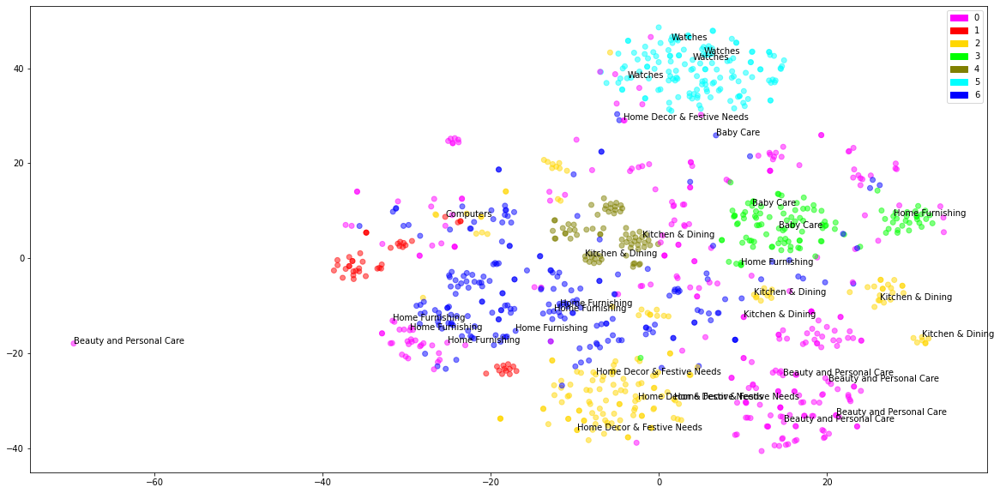

In [596]:
#On représente nos données

colors = []
legend =[]
categ = list(set(model.labels_))
color = ["magenta","red","gold","lime","olive","cyan","blue"]

for c in model.labels_:
    for i, ca in enumerate(categ):
        if c == ca:
            colors.append(color[i])
            
for i, ca in enumerate(categ):
    legend.append(mpatches.Patch(color=color[i], label=categ[i]))

fig, ax = plt.subplots(figsize=(20,10))
ax.scatter(X_tsne[:,0],X_tsne[:,1], c=colors[x_min:x_max], alpha=0.5)
ax.legend(handles=legend) 

for i, txt in enumerate(data["product_main_category"][x_min:x_max]):
#     if i%201 == 0 :
    if i%34 == 0 or X_tsne[i,0] < -60:
        ax.annotate(txt, (X_tsne[i,0], X_tsne[i,1]))

## 6 - Utilisation du LDA

In [619]:
tf_vectorizer = CountVectorizer(max_df=0.95, min_df=1, max_features=1000, stop_words='english')
tf = tf_vectorizer.fit_transform(corpus)

In [620]:
tf_feature_names = tf_vectorizer.get_feature_names()

In [621]:
len(tf_feature_names)

1000

In [622]:
n_topics = 7

# Créer le modèle LDA
lda = LatentDirichletAllocation(
        n_components=n_topics, 
        max_iter=5, 
        learning_method='online', 
        learning_offset=50.,
        random_state=1)

# Fitter sur les données
lda.fit(tf)

LatentDirichletAllocation(learning_method='online', learning_offset=50.0,
                          max_iter=5, n_components=7, random_state=1)

In [629]:
lda.score(tf)

-204266.53717376429

In [648]:
# Show top n keywords for each topic
def show_topics(vectorizer=vectorizer, lda_model=lda, n_words=20):
    keywords = np.array(vectorizer.get_feature_names())
    topic_keywords = []
    for topic_weights in lda_model.components_:
        top_keyword_locs = (-topic_weights).argsort()[:n_words]
        topic_keywords.append(keywords.take(top_keyword_locs))
    return topic_keywords

topic_keywords = show_topics(vectorizer=tf_vectorizer, lda_model=lda, n_words=5)
# Topic - Keywords Dataframe
df_topic_keywords = pd.DataFrame(topic_keywords)
df_topic_keywords.columns = ['Word '+str(i + 1) for i in range(df_topic_keywords.shape[1])]
df_topic_keywords.index = ['Topic '+str(i) for i in range(df_topic_keywords.shape[0])]
df_topic_keywords

,Word 1,Word 2,Word 3,Word 4,Word 5
Topic 0,ceram,gift,coffe,showpiec,perfect
Topic 1,babi,cotton,print,fabric,cover
Topic 2,sticker,wall,combo,showpiec,home
Topic 3,design,comfort,polyest,eyelet,curtain
Topic 4,laptop,skin,shape,print,mous
Topic 5,watch,analog,women,india,great
Topic 6,adapt,batteri,laptop,charger,bottl


In [652]:
Topics = ["Kitchen & Dining", "Baby Care", "Home Decor & Festive Needs", "Home Furnishing"
          ,"Beauty and Personal Care", "Watches", "Computers"]
df_topic_keywords["Topics"]=Topics
df_topic_keywords

,Word 1,Word 2,Word 3,Word 4,Word 5,Topics
Topic 0,ceram,gift,coffe,showpiec,perfect,Kitchen & Dining
Topic 1,babi,cotton,print,fabric,cover,Baby Care
Topic 2,sticker,wall,combo,showpiec,home,Home Decor & Festive Needs
Topic 3,design,comfort,polyest,eyelet,curtain,Home Furnishing
Topic 4,laptop,skin,shape,print,mous,Beauty and Personal Care
Topic 5,watch,analog,women,india,great,Watches
Topic 6,adapt,batteri,laptop,charger,bottl,Computers


# TRAITEMENT IMAGE

## 1 - Exploration des images

In [53]:
list_photos = data["image"]
print(len(list_photos))

1050


In [54]:
list_labels = data["product_main_category"].unique()

In [55]:
le = preprocessing.LabelEncoder()
data["label"] = le.fit_transform(data["product_main_category"])

Home Furnishing
-------


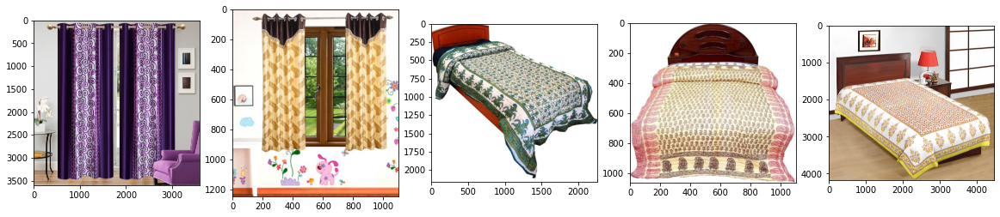

Baby Care
-------


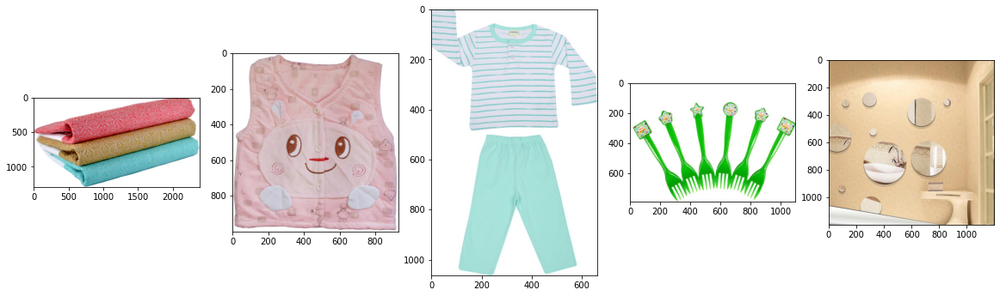

Watches
-------


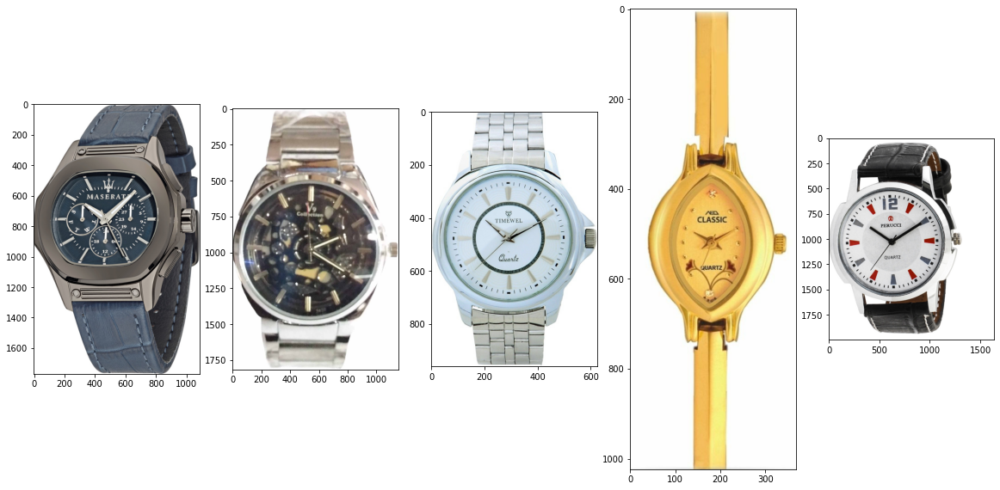

Home Decor & Festive Needs
-------


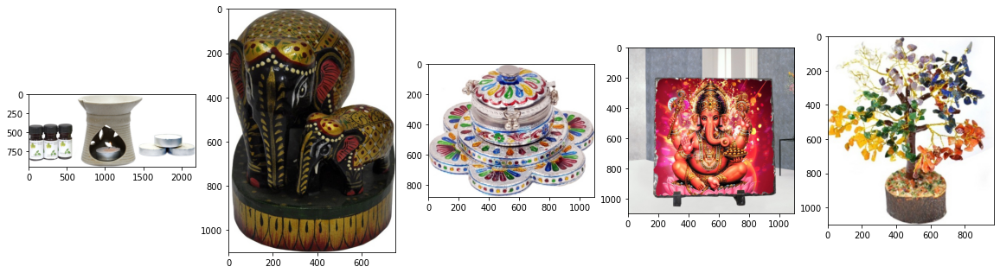

Kitchen & Dining
-------


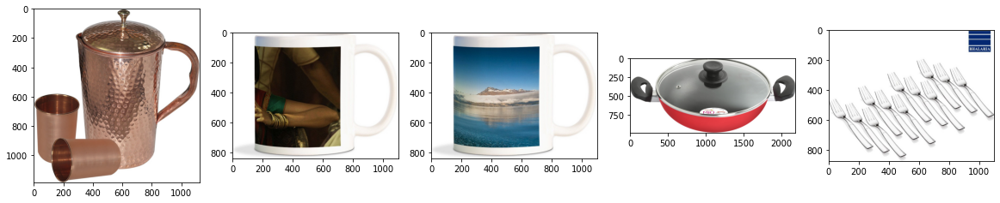

Beauty and Personal Care
-------


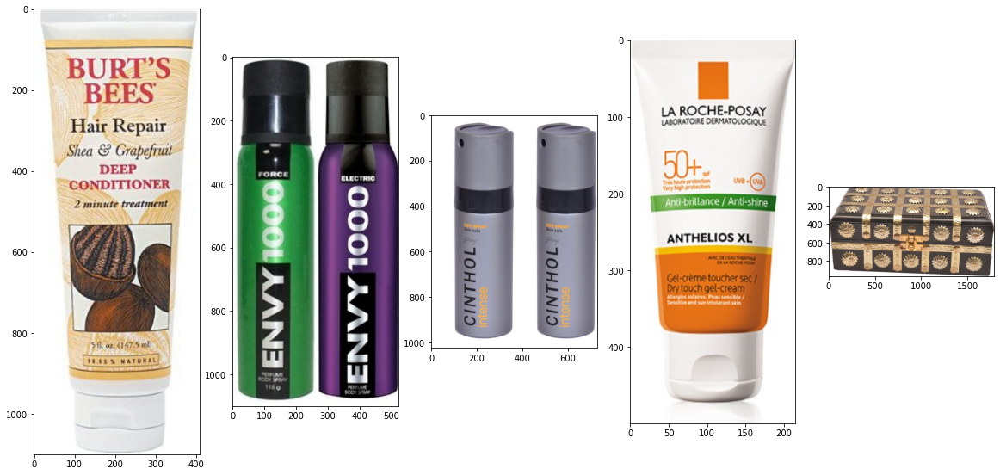

Computers
-------


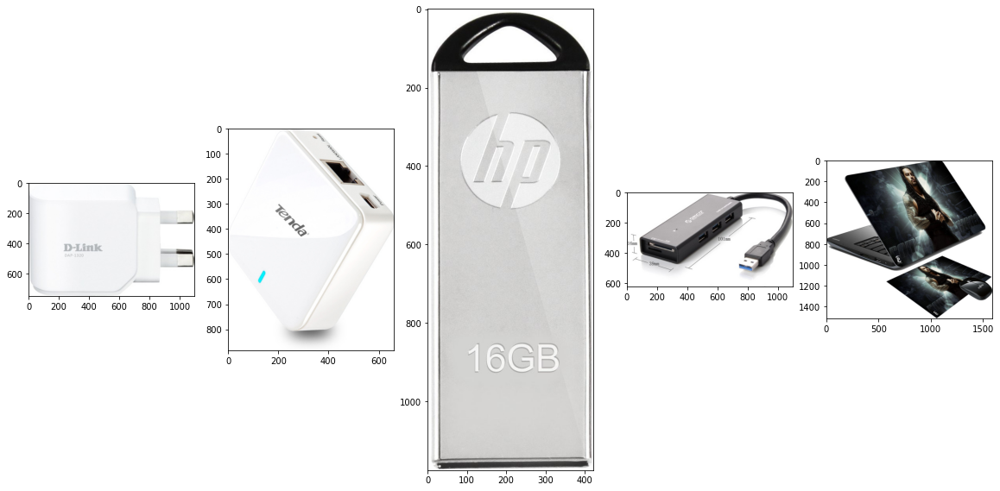

In [56]:
def list_fct(name) :
    list_image_name = [list_photos[i] for i in range(len(data)) if data["product_main_category"][i]==name]
    return list_image_name

list_home_furnishing=[list_photos[i] for i in range(len(data)) if data["product_main_category"][i]=="Home Furnishing"]
list_baby_care=[list_photos[i] for i in range(len(data)) if data["product_main_category"][i]=="Baby Care"]
list_watches=[list_photos[i] for i in range(len(data)) if data["product_main_category"][i]=="Watches"]
# list_home_decor=[list_photos[i] for i in range(len(data)) if data["product_main_category"][i]=="Home Decor & Festive Needs"]
list_kitchen=[list_photos[i] for i in range(len(data)) if data["product_main_category"][i]=="Kitchen & Dining"]
list_beauty=[list_photos[i] for i in range(len(data)) if data["product_main_category"][i]=="Beauty and Personal Care"]
list_computers=[list_photos[i] for i in range(len(data)) if data["product_main_category"][i]=="Computers"]


for name in list_labels :
    fig = plt.figure(figsize=(20,50))
    print(name)
    print("-------")
    for i in range(5):
        plt.subplot(150 + 1 + i)
        filename = "Images/" + list_fct(name)[i * 35]
        image = imread(filename)
        plt.imshow(image)
    plt.show()

# 2- Création des descripteurs

In [57]:
# pip install opencv-contrib-python --user

Note: you may need to restart the kernel to use updated packages.


Descripteurs :  (3583, 128)

[[162.   3.   0. ...   0.   0.   0.]
 [155.   0.   0. ...   5.   6.   2.]
 [131. 131.   0. ...   9.  15.   5.]
 ...
 [  5.   1.   0. ...   0.  17. 133.]
 [135.   0.   0. ...   0.   3.   2.]
 [135.  14.   0. ...   0.   0.   2.]]


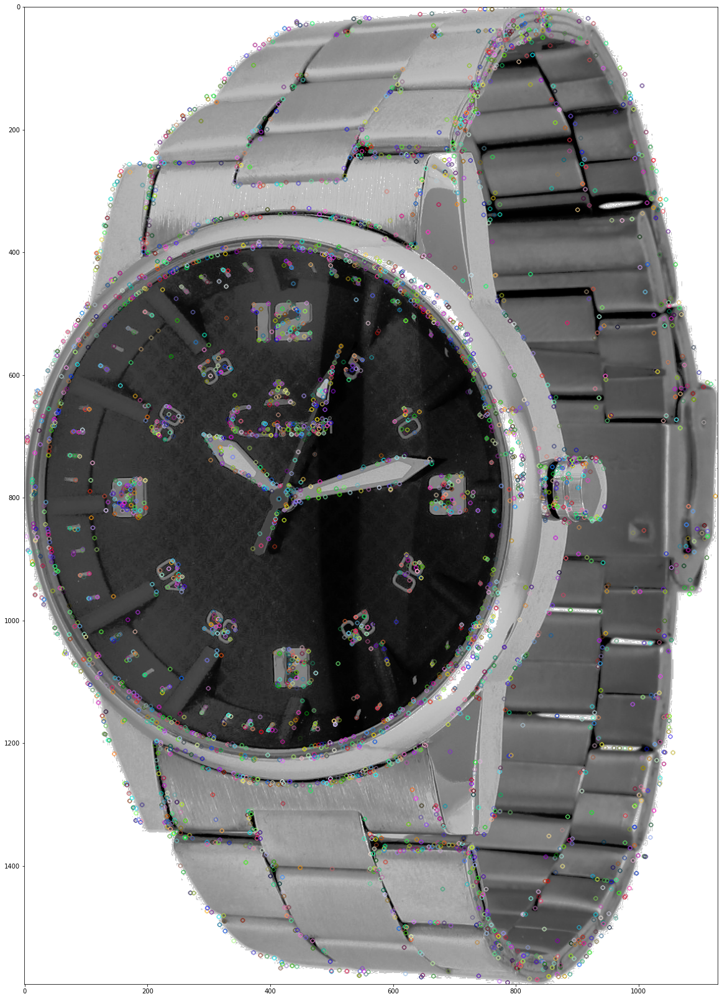

In [58]:
#L'image 2 est intéressante
sift = cv2.xfeatures2d.SIFT_create()
image = cv2.imread("Images/"+list_photos[6],0) # convert in gray
image = cv2.equalizeHist(image)   # equalize image histogram
kp, des = sift.detectAndCompute(image, None)
img=cv2.drawKeypoints(image,kp,image)

print("Descripteurs : ", des.shape)
print()
print(des)
fig = plt.figure(figsize=(20,50))
plt.imshow(img)
plt.show()

In [59]:
# identification of key points and associated descriptors
import time, cv2
sift_keypoints = []
temps1=time.time()
sift = cv2.xfeatures2d.SIFT_create(500)

for image_num in range(len(list_photos)) :
    if image_num%100 == 0 : print(image_num)
    image = cv2.imread("Images/"+list_photos[image_num],0) # convert in gray
    # image = cv2.cvtColor(image,cv2.COLOR_BGR2GRAY)
    res = cv2.equalizeHist(image)   # equalize image histogram
    kp, des = sift.detectAndCompute(res, None)
    sift_keypoints.append(des)

#on utilisera ce tableau pour réaliser les histogrammes par image
sift_keypoints_by_img = np.asarray(sift_keypoints)
# On utilisera ce tableau pour créer les clusters de descripteurs à partir de Kmeans
sift_keypoints_all = np.concatenate(sift_keypoints_by_img, axis=0)

print()
print("Nombre de descripteurs : ", sift_keypoints_all.shape)

duration1=time.time()-temps1
print("temps de traitement SIFT descriptor : ", "%15.2f" % duration1, "secondes")

0
100
200
300
400
500
600
700
800
900
1000


C:\Users\yacin\anaconda3\envs\tensorflow_env\lib\site-packages\numpy\core\_asarray.py:83: VisibleDeprecationWarning: Creating an ndarray from ragged nested sequences (which is a list-or-tuple of lists-or-tuples-or ndarrays with different lengths or shapes) is deprecated. If you meant to do this, you must specify 'dtype=object' when creating the ndarray
  return array(a, dtype, copy=False, order=order)



Nombre de descripteurs :  (517351, 128)
temps de traitement SIFT descriptor :          1277.23 secondes


## 3- Création des clusters des descripteurs

In [60]:
# from sklearn import cluster, metrics

# Determination number of clusters
temps1=time.time()

k = int(round(np.sqrt(len(sift_keypoints_all)),0))
print("Nombre de clusters estimés : ", k)
print("Création de",k, "clusters de descripteurs ...")

# Clustering
kmeans = MiniBatchKMeans(n_clusters=k, init_size=3*k, random_state=0)
kmeans.fit(sift_keypoints_all)

duration1=time.time()-temps1
print("temps de traitement kmeans : ", "%15.2f" % duration1, "secondes")

Nombre de clusters estimés :  719
Création de 719 clusters de descripteurs ...


C:\Users\yacin\anaconda3\envs\tensorflow_env\lib\site-packages\sklearn\cluster\_kmeans.py:888: UserWarning: MiniBatchKMeans is known to have a memory leak on Windows with MKL, when there are less chunks than available threads. You can prevent it by setting batch_size >= 2048 or by setting the environment variable OMP_NUM_THREADS=1
  f"MiniBatchKMeans is known to have a memory leak on "


temps de traitement kmeans :            61.87 secondes


In [61]:
# Création des histogrammes (features)
temps1=time.time()

def build_histogram(kmeans, des, image_num):
    res = kmeans.predict(des)
    hist = np.zeros(len(kmeans.cluster_centers_))
    nb_des=len(des)
    if nb_des==0 : print("problème histogramme image  : ", image_num)
    for i in res:
        hist[i] += 1.0/nb_des
    return hist


# Creation of a matrix of histograms
hist_vectors=[]

for i, image_desc in enumerate(sift_keypoints_by_img) :
    if i%100 == 0 : print(i)  
    hist = build_histogram(kmeans, image_desc, i) #calculates the histogram
    hist_vectors.append(hist) #histogram is the feature vector

im_features = np.asarray(hist_vectors)

duration1=time.time()-temps1
print("temps de création histogrammes : ", "%15.2f" % duration1, "secondes")


0
100
200
300
400
500
600
700
800
900
1000
temps de création histogrammes :             3.90 secondes


<BarContainer object of 719 artists>

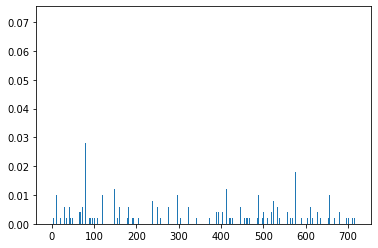

In [665]:
#Observation d'un histogramme
plt.bar(range(len(hist_vectors[6])),hist_vectors[6])

## 4- Réduction de dimensions

In [64]:
print("Dimensions dataset avant réduction PCA : ", im_features.shape)
pca = decomposition.PCA(n_components=0.99)
feat_pca= pca.fit_transform(im_features)
print("Dimensions dataset après réduction PCA : ", feat_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 719)
Dimensions dataset après réduction PCA :  (1050, 504)


In [692]:
tsne = TSNE(n_components=2, perplexity=30, n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(feat_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["product_main_category"]
print(df_tsne.shape)


(1050, 3)


In [693]:
df_tsne.head(5)
df_tsne["class"].unique()

array(['Home Furnishing', 'Baby Care', 'Watches',
       'Home Decor & Festive Needs', 'Kitchen & Dining',
       'Beauty and Personal Care', 'Computers'], dtype=object)

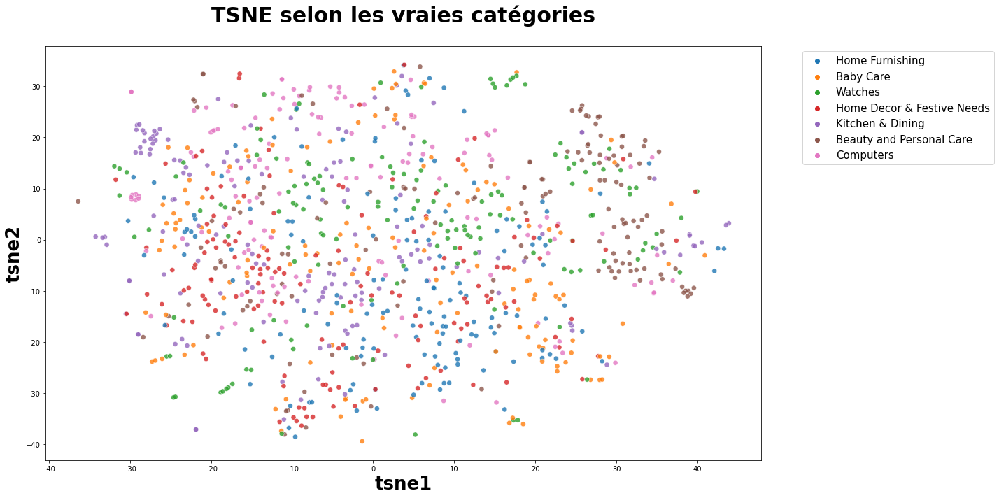

In [700]:
plt.figure(figsize=(20,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE selon les vraies catégories', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left', prop={'size': 15})
plt.tight_layout()

plt.show()

In [723]:
df_tsne_opt = df_tsne[df_tsne["class"].isin(['Watches','Computers'])]

In [724]:
df_tsne_opt.groupby("class").count()

,tsne1,tsne2
class,,
Computers,150,150
Watches,150,150


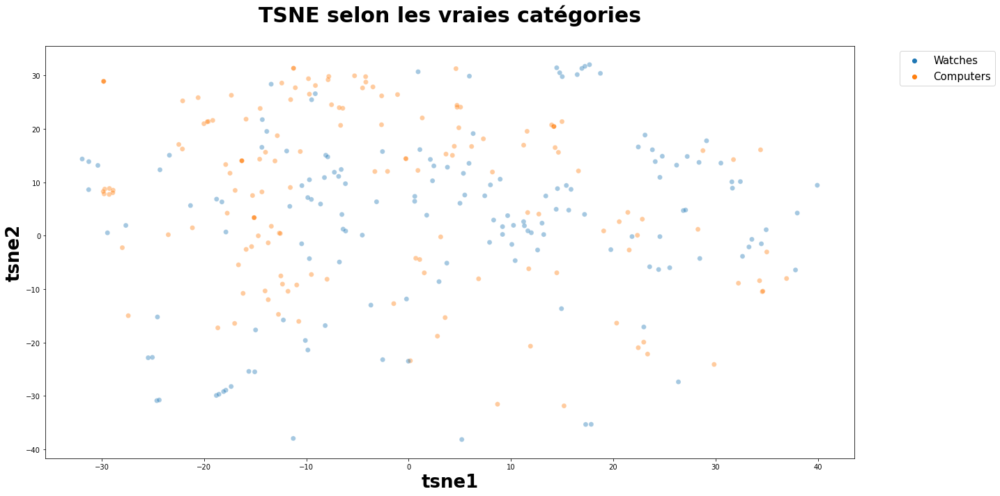

In [725]:
plt.figure(figsize=(20,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="class", data=df_tsne_opt, legend="brief",
    palette=sns.color_palette('tab10', n_colors=2), s=50, alpha=0.4)

plt.title('TSNE selon les vraies catégories', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
# plt.legend(prop={'size': 2})
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left', prop={'size': 15})
plt.tight_layout()

plt.show()

In [727]:
cls = cluster.KMeans(n_clusters=7, random_state=6)
cls.fit(X_tsne)

df_tsne["cluster"] = cls.labels_
print(df_tsne.shape)

ERROR! Session/line number was not unique in database. History logging moved to new session 607
(1050, 4)


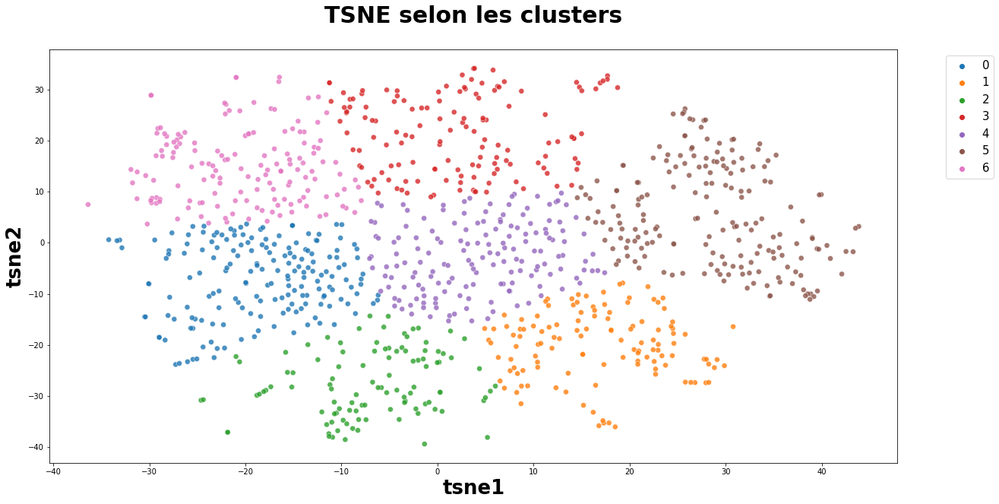

ARI :  0.06


In [729]:
plt.figure(figsize=(20,10))
sns.scatterplot(
    x="tsne1", y="tsne2",
    hue="cluster",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8,
    data=df_tsne,
    legend="brief")

plt.title('TSNE selon les clusters', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
plt.legend(bbox_to_anchor=(1.05, 1.0), loc='upper left', prop={'size': 15}) 

plt.show()

labels = data["label"]
print("ARI : ", round(metrics.adjusted_rand_score(labels, cls.labels_), 2))

In [72]:
df_tsne.groupby("cluster").count()["class"]

cluster
0    180
1    123
2    106
3    140
4    162
5    186
6    153
Name: class, dtype: int64

In [73]:
#On compare les catégories aux catégories trouvéés par notre Kmeans
conf_mat = metrics.confusion_matrix(labels, cls.labels_)
print(conf_mat)

[[26 39 14 18 24 11 18]
 [18  3 10 11 12 84 12]
 [28  8  2 46 11 17 38]
 [48 22 27  7 21 10 15]
 [16 41 22 15 31 13 12]
 [34  5 15 15 29 15 37]
 [10  5 16 28 34 36 21]]


In [74]:
np.argmax(metrics.confusion_matrix(labels, cls.labels_), axis=0)

array([3, 4, 3, 2, 6, 1, 2], dtype=int64)

In [75]:
def conf_mat_transform(y_true,y_pred) :
    conf_mat = metrics.confusion_matrix(y_true,y_pred)
    
#     corresp = np.argmax(conf_mat, axis=0)
    corresp = [3, 4, 0, 2, 6, 1, 5]
    print ("Correspondance des clusters : ", corresp)
#     y_pred_transform = np.apply_along_axis(corresp, 1, y_pred)
    labels = pd.Series(y_true, name="y_true").to_frame()
    labels['y_pred'] = y_pred
    labels['y_pred_transform'] = labels['y_pred'].apply(lambda x : corresp[x]) 
    
    return labels['y_pred_transform']

cls_labels_transform = conf_mat_transform(labels, cls.labels_)
conf_mat = metrics.confusion_matrix(labels, cls_labels_transform)
print(conf_mat)
print()
print(metrics.classification_report(labels, cls_labels_transform))

Correspondance des clusters :  [3, 4, 0, 2, 6, 1, 5]
[[14 11 18 26 39 18 24]
 [10 84 11 18  3 12 12]
 [ 2 17 46 28  8 38 11]
 [27 10  7 48 22 15 21]
 [22 13 15 16 41 12 31]
 [15 15 15 34  5 37 29]
 [16 36 28 10  5 21 34]]

              precision    recall  f1-score   support

           0       0.13      0.09      0.11       150
           1       0.45      0.56      0.50       150
           2       0.33      0.31      0.32       150
           3       0.27      0.32      0.29       150
           4       0.33      0.27      0.30       150
           5       0.24      0.25      0.24       150
           6       0.21      0.23      0.22       150

    accuracy                           0.29      1050
   macro avg       0.28      0.29      0.28      1050
weighted avg       0.28      0.29      0.28      1050



<AxesSubplot:>

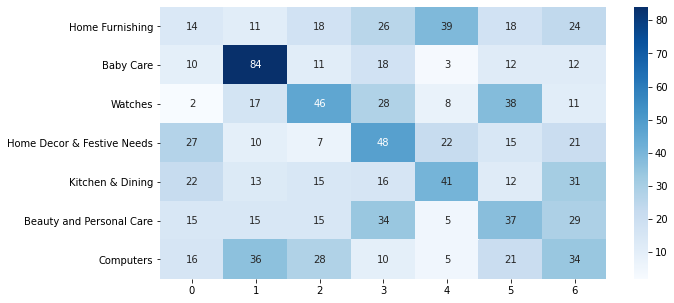

In [731]:
df_cm = pd.DataFrame(conf_mat, index = [label for label in list_labels],
                  columns = [i for i in "0123456"])
plt.figure(figsize = (10,5))
sns.heatmap(df_cm, annot=True, cmap="Blues")

## 5- CNN avec Transfer Learning

In [78]:
# Création du modèle VGG-16 implementé par Keras et suppresion de la dernière couche
model = VGG16()
# model = Model(inputs = model.inputs, outputs = model.layers[-2].output)

In [79]:
# load the image as a 224x224 array
img = load_img("Images/" + list_photos[0], target_size=(224,224))

In [80]:
def extract_features(file, model):
    # load the image as a 224x224 array
    img = load_img(file, target_size=(224,224))
    # convert from 'PIL.Image.Image' to numpy array
    img = np.array(img) 
    # reshape the data for the model reshape(num_of_samples, dim 1, dim 2, channels)
    reshaped_img = img.reshape(1,224,224,3) 
    # prepare image for model
    imgx = preprocess_input(reshaped_img)
    # get the feature vector
    features = model.predict(imgx, use_multiprocessing=True)
    return features

In [81]:
photos_CNN = {}
i = 0

start = datetime.datetime.now() 
for photo in list_photos:
    if i%100 == 0 : print(i) 
    features = extract_features("Images/" + photo,model)
    photos_CNN[photo] = features
    i += 1                   
end = datetime.datetime.now()
time_nn = (end - start).total_seconds()
print(time_nn)

0
100
200
300
400
500
600


C:\Users\yacin\anaconda3\envs\tensorflow_env\lib\site-packages\PIL\Image.py:2858: DecompressionBombWarning: Image size (93680328 pixels) exceeds limit of 89478485 pixels, could be decompression bomb DOS attack.
  DecompressionBombWarning,


700
800
900
1000
256.242356


In [754]:
# get a list of the filenames
file_names = np.array(list(photos_CNN.keys()))

# get a list of just the features
photo_features = np.array(list(photos_CNN.values()))
photo_features = photo_features.reshape(-1,1000)
photo_features.shape

(1050, 1000)

In [755]:
#On a 1000 valeurs par photo qui correspondent aux pourcentages d'appartenance à une classe
list(photos_CNN.values())[0].shape

(1, 1000)

Top 3 : [('n02808304', 'bath_towel', 0.99983907), ('n04599235', 'wool', 0.00011961622), ('n04525038', 'velvet', 2.696543e-05)]


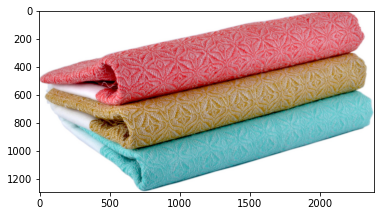

------------------------------------------------------------------------------------------------
Top 3 : [('n04458633', 'totem_pole', 0.68938386), ('n03000684', 'chain_saw', 0.15805675), ('n03126707', 'crane', 0.05884212)]


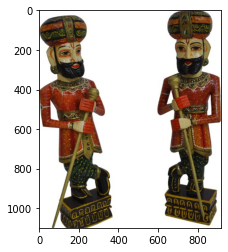

------------------------------------------------------------------------------------------------
Top 3 : [('n03476991', 'hair_spray', 0.6992948), ('n03843555', 'oil_filter', 0.21946068), ('n04357314', 'sunscreen', 0.053240728)]


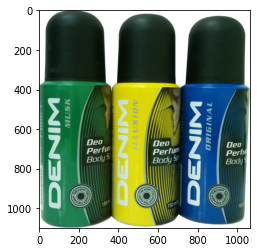

------------------------------------------------------------------------------------------------
Top 3 : [('n03063599', 'coffee_mug', 0.8281932), ('n07930864', 'cup', 0.13722186), ('n02909870', 'bucket', 0.004031686)]


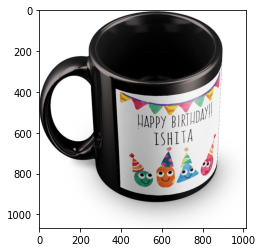

------------------------------------------------------------------------------------------------
Top 3 : [('n03690938', 'lotion', 0.45137477), ('n03937543', 'pill_bottle', 0.11975443), ('n04357314', 'sunscreen', 0.08822899)]


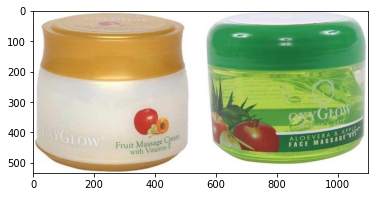

------------------------------------------------------------------------------------------------


In [756]:
# Afficher les 3 classes les plus probables
for i in range(0,5):
    
    #i*10 
    ind = i * 200 + 1
    print('Top 3 :', decode_predictions(list(photos_CNN.values())[ind], top=3)[0])
    
    filename = "Images/" + list_photos[ind]
    image = imread(filename)
    plt.imshow(image)
    plt.show()
    
    print("------------------------------------------------------------------------------------------------")

In [85]:
print("Dimensions dataset avant réduction PCA : ", photo_features.shape)
pca = decomposition.PCA(n_components=0.99)
photo_features_pca= pca.fit_transform(photo_features)
print("Dimensions dataset après réduction PCA : ", photo_features_pca.shape)

Dimensions dataset avant réduction PCA :  (1050, 1000)
Dimensions dataset après réduction PCA :  (1050, 202)


In [86]:
inertia = []
silhouette = []
K_range = range(2,13)

#On cherche le nombre de clusters optimal
for k in K_range:
    model = KMeans(n_clusters=k).fit(photo_features_pca)
    inertia.append(model.inertia_)
    silhouette.append(metrics.silhouette_score(X, model.labels_))

Text(0.5, 1.0, 'Silhouette graph')

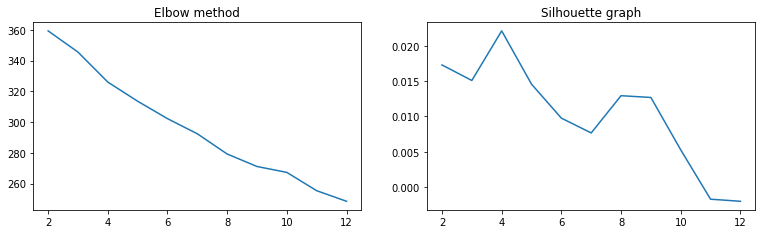

In [87]:
#On observe les graphes
fig = plt.figure(figsize=(20,20))
ax1 = fig.add_subplot(5,3,1)
plt.plot(K_range, inertia)
plt.title("Elbow method")

ax2 = fig.add_subplot(5,3,2)
plt.plot(K_range, silhouette)
plt.title("Silhouette graph")

In [788]:
kmeans = KMeans(n_clusters=7, random_state=22)
kmeans.fit(photo_features_pca)

KMeans(n_clusters=7, random_state=22)

In [789]:
import collections
collections.Counter(kmeans.labels_)

Counter({1: 711, 5: 119, 3: 69, 0: 76, 4: 43, 6: 16, 2: 16})

In [790]:
# holds the cluster id and the images { id: [images] }
groups = {}
for file, cluster in zip(file_names,kmeans.labels_):
    if cluster not in groups.keys():
        groups[cluster] = []
        groups[cluster].append(file)
    else:
        groups[cluster].append(file)

Cluster  0  :  76  items


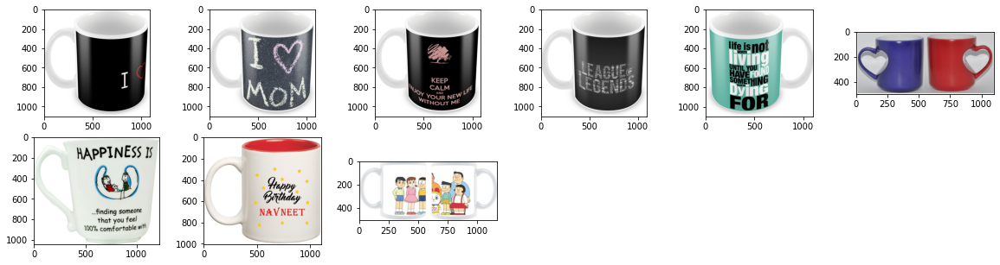

Cluster  1  :  711  items


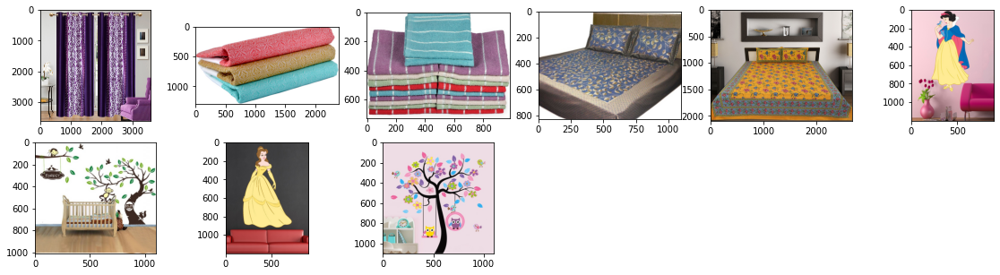

Cluster  2  :  16  items


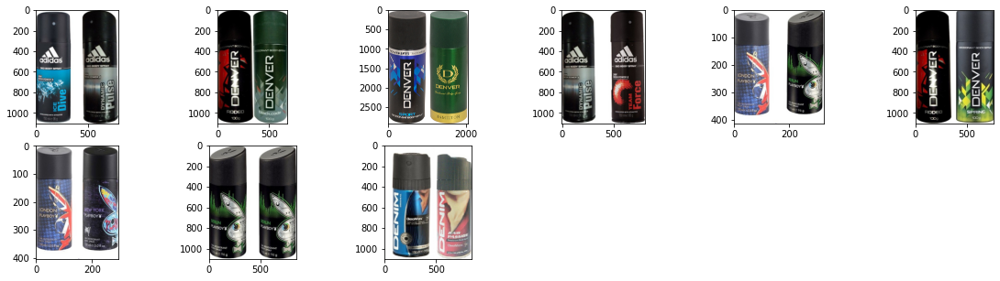

Cluster  3  :  69  items


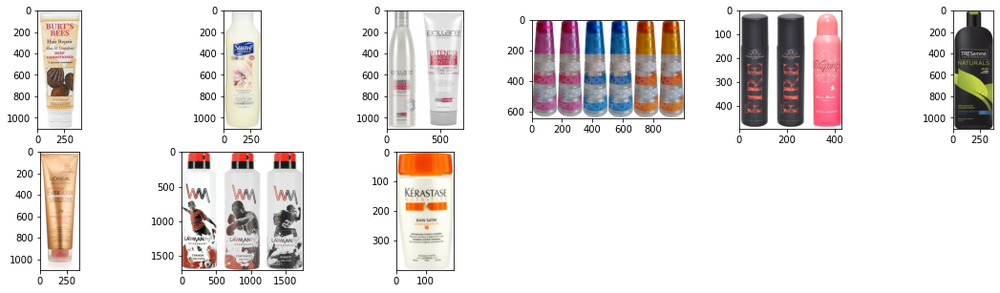

Cluster  4  :  43  items


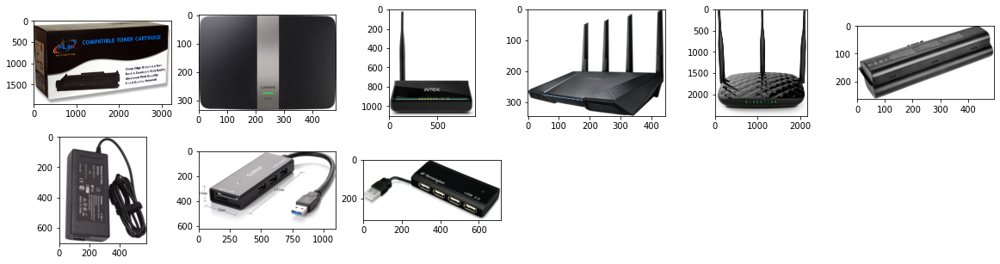

Cluster  5  :  119  items


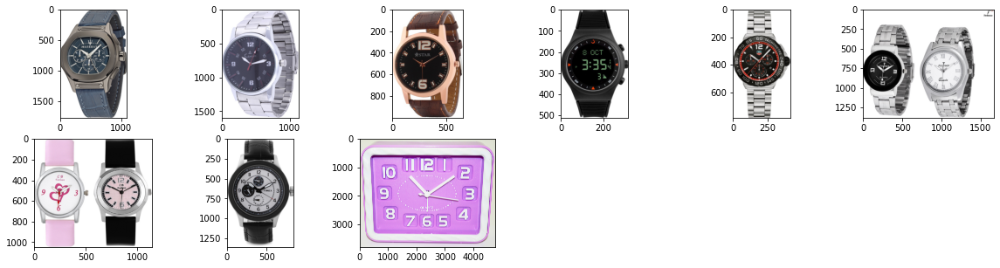

Cluster  6  :  16  items


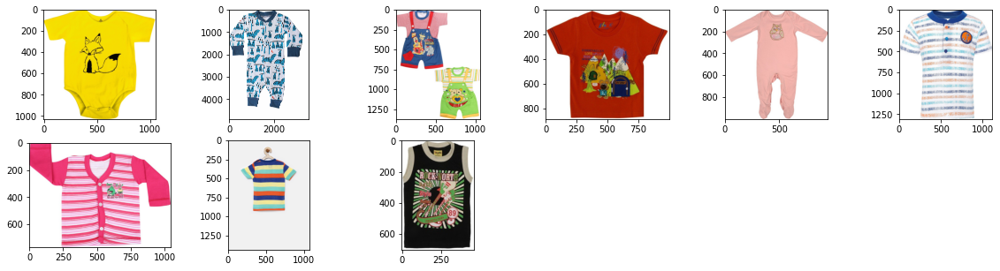

In [791]:
for i in range(7):
    j = 0
    fig = plt.figure(figsize=(20,5))
    print("Cluster ", i, " : ", len(groups[i]), " items")
    
    photos = groups[i][:5] + groups[i][-4:]
    for photo in photos:
        plt.subplot(260 + 1 + j)
        filename = "Images/" + photo
        image = imread(filename)
        plt.imshow(image)
        j += 1
    plt.show()
            

In [797]:
#Marche bien avec 30
tsne = TSNE(n_components=2, perplexity= 20, n_iter=2000, init='random', random_state=6)
X_tsne = tsne.fit_transform(photo_features_pca)

df_tsne = pd.DataFrame(X_tsne[:,0:2], columns=['tsne1', 'tsne2'])
df_tsne["class"] = data["product_main_category"]
df_tsne["label"] = le.fit_transform(data["product_main_category"])
df_tsne["cluster"] = kmeans.labels_
df_tsne["photo"] = list_photos
print(df_tsne.shape)

(1050, 6)


In [798]:
print("ARI : ", round(metrics.adjusted_rand_score(df_tsne["label"], df_tsne["cluster"]), 2))

ARI :  0.12


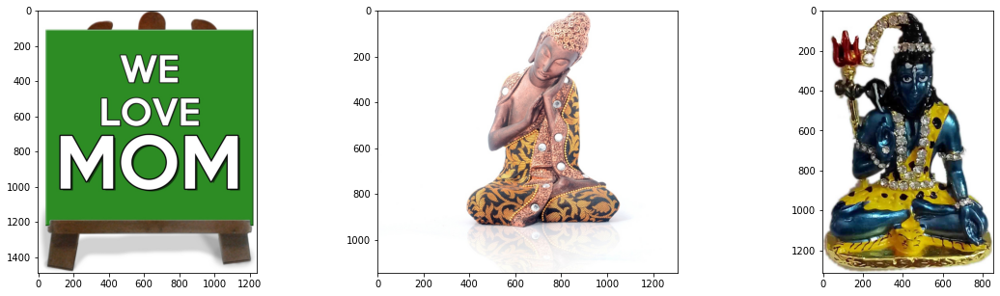

In [799]:
#On observe les outliers
fig = plt.figure(figsize=(20,5))
j = 0

for i in df_tsne[df_tsne["tsne2"] < -50].index:
    plt.subplot(130 + 1 + j)
    filename = "Images/" + list_photos[i]
    image = imread(filename)
    plt.imshow(image)
    j += 1
plt.show()

In [800]:
df_tsne_opt = df_tsne[df_tsne["tsne2"] > -50]

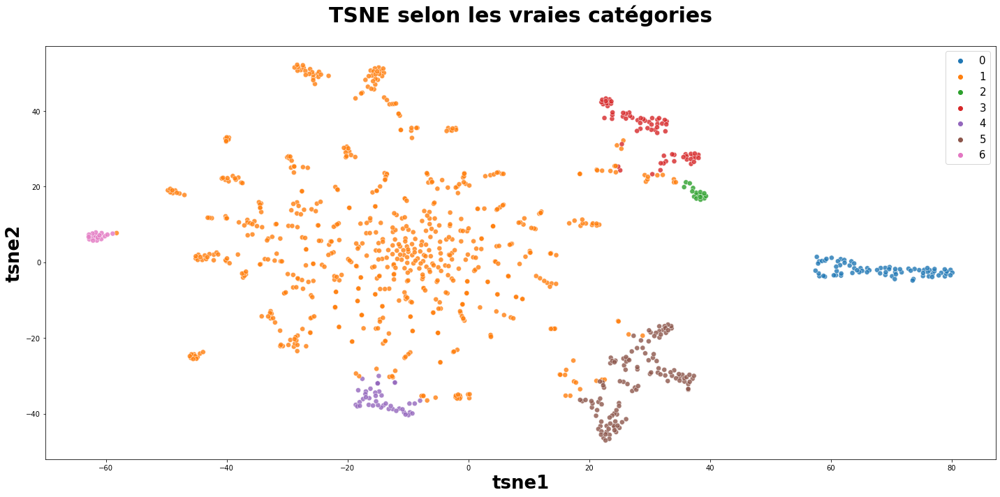

In [801]:
plt.figure(figsize=(20,10))
sns.scatterplot(
    x="tsne1", y="tsne2", hue="cluster", data=df_tsne_opt, legend="brief",
    palette=sns.color_palette('tab10', n_colors=7), s=50, alpha=0.8)

plt.title('TSNE selon les vraies catégories', fontsize = 30, pad = 35, fontweight = 'bold')
plt.xlabel('tsne1', fontsize = 26, fontweight = 'bold')
plt.ylabel('tsne2', fontsize = 26, fontweight = 'bold')
# plt.legend(prop={'size': 2})
plt.legend(loc='best', prop={'size': 15})
plt.tight_layout()

plt.show()

## 6- Visualisation des clusters image

In [830]:
df_tsne_opt_test = pd.concat([df_tsne_opt[:100], df_tsne_opt[450:550], df_tsne_opt[-100:]])
list_photos_test = pd.concat([list_photos[:100], list_photos[450:550], list_photos[-100:]])

In [837]:
max(df_tsne_opt_test["tsne1"])

16.10711669921875

In [838]:
abs(min(df_tsne_opt_test["tsne1"]))

43.92582321166992

In [833]:
int((width/2) / max(max(df_tsne_opt_test["tsne1"]),max(df_tsne_opt_test["tsne1"])))

25

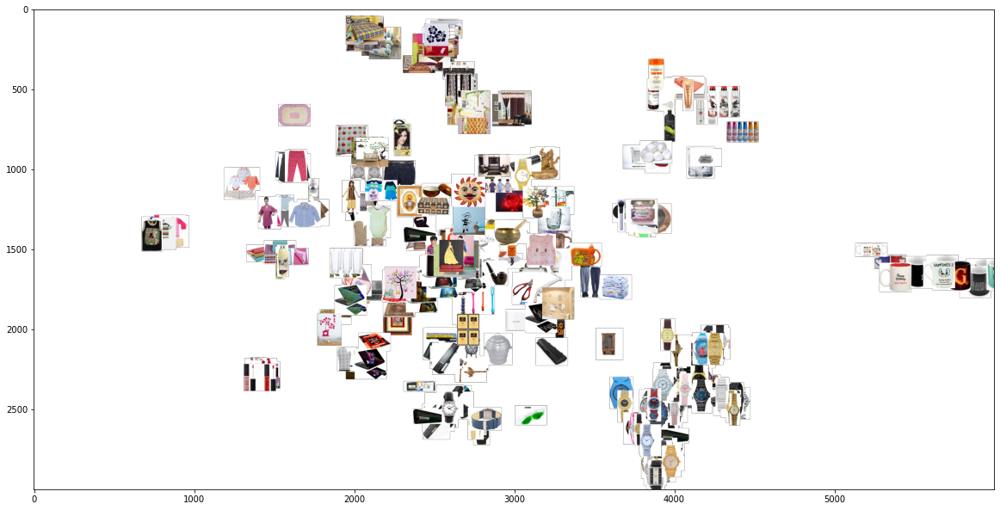

In [834]:
width = 6000
height = 3000
max_dim = 200

#Permet d'étaler aux maximum nos images
x_max = int((width/2) / max(max(df_tsne_opt_test["tsne1"]), abs(min(df_tsne_opt_test["tsne1"]))))
y_max = int((height/2) / max(max(df_tsne_opt_test["tsne2"]), abs(min(df_tsne_opt_test["tsne2"]))))

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(list_photos_test, df_tsne_opt_test["tsne1"], df_tsne_opt_test["tsne2"]):
    tile = Image.open("Images/" + img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width/2)+x_max*x), int((height/2)-y_max*y)))

plt.figure(figsize = (20,20))
plt.imshow(full_image)

In [825]:
df_tsne_opt_test = df_tsne_opt[df_tsne_opt["class"] == "Watches"]
list_photos_test = list(df_tsne_opt[df_tsne_opt["class"] == "Watches"]["photo"])

Text(0.5, 1.0, 'Watches')

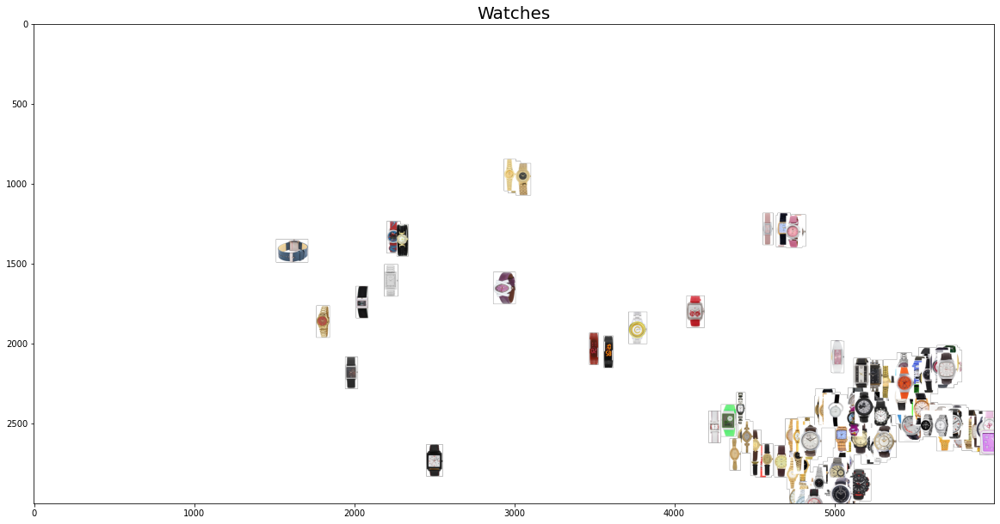

In [829]:
width = 6000
height = 3000
max_dim = 200

#Permet d'étaler aux maximum nos images
x_max = int((width/2) / max(max(df_tsne_opt_test["tsne1"]), abs(min(df_tsne_opt_test["tsne1"]))))
y_max = int((height/2) / max(max(df_tsne_opt_test["tsne2"]), abs(min(df_tsne_opt_test["tsne2"]))))

full_image = Image.new('RGBA', (width, height))
for img, x, y in zip(list_photos_test, df_tsne_opt_test["tsne1"], df_tsne_opt_test["tsne2"]):
    tile = Image.open("Images/" + img)
    rs = max(1, tile.width/max_dim, tile.height/max_dim)
    tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
    full_image.paste(tile, (int((width/2)+x_max*x), int((height/2)-y_max*y)))

plt.figure(figsize = (20,20))
plt.imshow(full_image)
plt.title("Watches", fontsize="20")

In [105]:
df_tsne_opt_test = df_tsne_opt[df_tsne_opt["class"] == "Home Decor & Festive Needs"]
list_photos_test = list(df_tsne_opt[df_tsne_opt["class"] == "Home Decor & Festive Needs"]["photo"])

In [106]:
df_tsne_opt["class"].unique()[0]

'Home Furnishing'

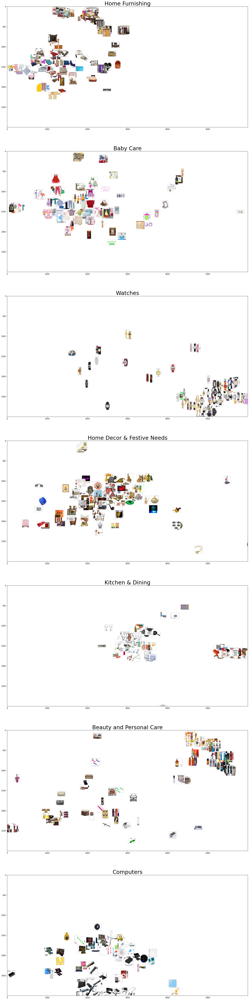

In [836]:
i = 0
fig = plt.figure(figsize=(100,100))
for categ in df_tsne_opt["class"].unique():
    df_tsne_opt_test = df_tsne_opt[df_tsne_opt["class"] == categ]
    list_photos_test = list(df_tsne_opt[df_tsne_opt["class"] == categ]["photo"])

    width = 6000
    height = 3000
    max_dim = 200

    #Permet d'étaler aux maximum nos images
    x_max = int((width/2) / max(max(df_tsne_opt_test["tsne1"]), abs(min(df_tsne_opt_test["tsne1"]))))
    y_max = int((height/2) / max(max(df_tsne_opt_test["tsne2"]), abs(min(df_tsne_opt_test["tsne2"]))))

    full_image = Image.new('RGBA', (width, height))
    for img, x, y in zip(list_photos_test, df_tsne_opt_test["tsne1"], df_tsne_opt_test["tsne2"]):
        tile = Image.open("Images/" + img)
        rs = max(1, tile.width/max_dim, tile.height/max_dim)
        tile = tile.resize((int(tile.width/rs), int(tile.height/rs)), Image.ANTIALIAS)
        full_image.paste(tile, (int((width/2)+x_max*x), int((height/2)-y_max*y)))

    plt.subplot(710 + 1 + i)
    plt.imshow(full_image)
    plt.title(categ, fontsize="30")
    i += 1